In [1]:
from mistral_common.protocol.instruct.messages import (
    UserMessage,
)
from mistral_common.protocol.instruct.request import ChatCompletionRequest
from mistral_common.protocol.instruct.tool_calls import (
    Function,
    Tool,
)
from mistral_common.tokens.tokenizers.mistral import MistralTokenizer

In [1]:
from transformers import AutoProcessor, AutoModelForTokenClassification
import torch
import geopandas as gpd
import os
from pathlib import Path
from utils import sliding_window
from core import LayoutLMv3Interface, SQLite3Interface
ROOT_DIR = Path(os.getcwd()).parent

os.environ["TOKENIZERS_PARALLELISM"] = "false"

layoutlmv3_interface = LayoutLMv3Interface(
    model_path=os.path.join(ROOT_DIR, "models/layoutlmv3/checkpoint-400"),
    processor_path="microsoft/layoutlmv3-large",
    verbose=True
)


In [5]:

sqllite3_interface = SQLite3Interface(
    database=os.path.join("/Users/user/Projects/AI_Osrodek/data/databases/ecclesia.db"),
)

In [3]:
SCHEMATISMS_DIR = os.path.join(ROOT_DIR, "data/schematyzmy")
RESULTS_DIR = os.path.join(ROOT_DIR, "data/results")
schematisms_to_evaluate = ["wloclawek_1872"]

In [5]:
def evaluate_schematism(schematism_dir):

    shapefile_path = os.path.join(schematism_dir, "matryca/matryca.shp")

    if os.path.exists(shapefile):
        gdf = load_shapefile(shapefile_path)

    for image_path in sorted(os.listdir(schematism_dir)):
        if not image_path.endswith(".jpg"):
            continue

        print("Running predict on image: ", image_path)

        image_path = os.path.join(schematism_dir, image_path)
        bboxes, predictions, words = layoutlmv3_interface.predict(image_path)
        print(bboxes)
        print(predictions)
        print(words)


In [6]:
# for schematism_dir in os.listdir(SCHEMATISMS_DIR):
#     if not os.path.isdir(os.path.join(SCHEMATISMS_DIR, schematism_dir)):
#         continue
#     if schematism_dir in schematisms_to_evaluate:
#         results = evaluate_schematism(os.path.join(SCHEMATISMS_DIR, schematism_dir))



In [6]:
sqllite3_interface.get_schema("dane_hasla")

[(0, 'id', 'INTEGER', 0, None, 1),
 (1, 'dekanat', 'TEXT', 0, None, 0),
 (2, 'diecezja', 'TEXT', 0, None, 0),
 (3, 'parafia', 'TEXT', 0, None, 0),
 (4, 'miejsce', 'TEXT', 0, None, 0),
 (5, 'typ_obiektu', 'TEXT', 0, None, 0),
 (6, 'wezwanie', 'TEXT', 0, None, 0),
 (7, 'wezwanie_par', 'TEXT', 0, None, 0),
 (8, 'material_typ', 'TEXT', 0, None, 0),
 (9, 'the_geom', 'TEXT', 0, None, 0),
 (10, 'strona_p', 'TEXT', 0, None, 0),
 (11, 'strona_k', 'TEXT', 0, None, 0),
 (12, 'skany', 'TEXT', 0, None, 0),
 (13, 'faksymile', 'TEXT', 0, None, 0)]

In [7]:
geometries = sqllite3_interface.query(["id", "dekanat", "miejsce", "wezwanie", "material_typ", "the_geom" , "skany"], {"skany": "'tarnow_1870'"}, table_name="dane_hasla")
geometries

Query: SELECT id, dekanat, miejsce, wezwanie, material_typ, the_geom, skany FROM dane_hasla WHERE skany = 'tarnow_1870'


[(22143,
  'Wojnicz',
  'Borzęcin',
  'Narodzenie Najświętszej Maryi Panny',
  'mr',
  'MULTIPOLYGON (((1899.0899998473997 1611.1110001526, 1899.0899998473997 1611.9930001526, 1907.4059998474 1611.9930001526, 1907.4059998474 1611.1110001526, 1899.0899998473997 1611.1110001526)))',
  'tarnow_1870'),
 (22144,
  'Wojnicz',
  'Cerekiew',
  'Wawrzyniec Męczennik',
  'dr',
  'MULTIPOLYGON (((1913.7899998473995 1616.5430001525997, 1913.7899998473995 1617.9150001526, 1921.9939998474006 1617.9150001526, 1921.9939998474006 1616.5430001525997, 1913.7899998473995 1616.5430001525997)))',
  'tarnow_1870'),
 (22145,
  'Wojnicz',
  'Dembno',
  'Małgorzata Panna Męczennica',
  'mr',
  'MULTIPOLYGON (((1913.6779998473996 1609.8790001526, 1913.6779998473996 1611.5590001526002, 1922.0079998473996 1611.5590001526002, 1922.0079998474005 1609.8790001526, 1913.6779998473996 1609.8790001526)))',
  'tarnow_1870'),
 (22146,
  'Wojnicz',
  'Jadowniki',
  'Prokop Opat',
  'dr',
  'MULTIPOLYGON (((1925.269999847399

In [8]:
shapefile_path = os.path.join(SCHEMATISMS_DIR, "tarnow_1870", "matryca/matryca.shp")

shp_gdf = gpd.read_file(shapefile_path)
shp_gdf.head()

DataSourceError: /Users/user/Projects/AI_Osrodek/data/schematyzmy/tarnow_1870/matryca/matryca.shp: No such file or directory

In [9]:
import geopandas as gpd
from shapely import wkt

# [(26291,
#   'Włocławek',
#   'Jan Chrzciciel',
#   'mr',
#   'MULTIPOLYGON (((36.253799987793 2317.4447000122, 36.253799987793 2317.7807000122, 39.573799987792995 2317.7807000122, 39.573799987792995 2317.4447000122, 36.253799987793 2317.4447000122)))',
#   'wloclawek_1872'),

geom_list = []
for geom in geometries:
    _, deanery, parish, dedication, material_type, geom, schematism = geom

    try:
        geom = wkt.loads(geom)
    except Exception as e:
        print(f"Error loading WKT: {geom}")
        print(e)
        continue
    geom_list.append({
        "deanery": deanery,
        "parish": parish,
        "dedication": dedication,
        "material_type": material_type,
        "geom": geom,
        "schematism": schematism
    })
    print(geom)
   # geon_list.append({"miejsce"})

sql_gdf = gpd.GeoDataFrame(geom_list, geometry="geom", crs=shp_gdf.crs)
# inner join 
joined_gdf = gpd.sjoin(shp_gdf, sql_gdf, how="inner", predicate="intersects")
print(joined_gdf.head())


MULTIPOLYGON (((1899.0899998473997 1611.1110001526, 1899.0899998473997 1611.9930001526, 1907.4059998474 1611.9930001526, 1907.4059998474 1611.1110001526, 1899.0899998473997 1611.1110001526)))
MULTIPOLYGON (((1913.7899998473995 1616.5430001525997, 1913.7899998473995 1617.9150001526, 1921.9939998474006 1617.9150001526, 1921.9939998474006 1616.5430001525997, 1913.7899998473995 1616.5430001525997)))
MULTIPOLYGON (((1913.6779998473996 1609.8790001526, 1913.6779998473996 1611.5590001526002, 1922.0079998473996 1611.5590001526002, 1922.0079998474005 1609.8790001526, 1913.6779998473996 1609.8790001526)))
MULTIPOLYGON (((1925.2699998473993 1614.5410001525997, 1925.2699998473993 1615.8010001526, 1933.5579998474007 1615.8010001526, 1933.5579998474007 1614.5410001525997, 1925.2699998473993 1614.5410001525997)))
MULTIPOLYGON (((1925.2657999572998 1605.1732000427, 1925.2657999572998 1608.0852000427003, 1933.6097999572999 1608.0852000427003, 1933.6097999573003 1605.1732000427, 1925.2657999572998 1605.

NameError: name 'shp_gdf' is not defined

In [ ]:
joined_gdf

,location,geometry,index_right,deanery,parish,dedication,material_type,schematism
17,0018.jpg,"POLYGON ((220.995 1620.005, 233.057 1620.005, ...",325,[brak informacji],Tarnów,Narodzenie Najświętszej Maryi Panny,mr,tarnow_1870
20,0021.jpg,"POLYGON ((259.995 1620.005, 271.849 1620.005, ...",104,Dąbrowa,Bolesław,Wojciech Biskup Męczennik,mr,tarnow_1870
21,0022.jpg,"POLYGON ((272.995 1620.005, 284.964 1620.005, ...",153,Dąbrowa,Gręboszów,Najświętsza Maryja Panna Wniebowzięta,mr,tarnow_1870
21,0022.jpg,"POLYGON ((272.995 1620.005, 284.964 1620.005, ...",151,Dąbrowa,Dąbrowa,Wszyscy Święci,dr,tarnow_1870
22,0023.jpg,"POLYGON ((285.995 1620.005, 297.964 1620.005, ...",154,Dąbrowa,Olesno,Katarzyna Panna Męczennica,mr,tarnow_1870
...,...,...,...,...,...,...,...,...
204,0206.jpg,"POLYGON ((2651.995 1620.005, 2664.109 1620.005...",257,Żywiec,Slemień,Jan Chrzciciel,mr,tarnow_1870
204,0206.jpg,"POLYGON ((2651.995 1620.005, 2664.109 1620.005...",256,Żywiec,Rychwałd,Mikołaj Biskup,mr,tarnow_1870
205,0207.jpg,"POLYGON ((2664.995 1620.005, 2677.109 1620.005...",258,Żywiec,Szczyrk,Jakub Większy Apostoł,dr,tarnow_1870
206,0208.jpg,"POLYGON ((2677.995 1620.005, 2690.057 1620.005...",259,Żywiec,Żywiec,Narodzenie Najświętszej Maryi Panny,mr,tarnow_1870


In [ ]:

sample = joined_gdf.drop(columns=[ "geometry", "index_right"])
# convert to a dictionary
sample = sample.to_dict(orient="records")
sample


for record in sample:
    print(record)

{'location': '0018.jpg', 'deanery': '[brak informacji]', 'parish': 'Tarnów', 'dedication': 'Narodzenie Najświętszej Maryi Panny', 'material_type': 'mr', 'schematism': 'tarnow_1870'}
{'location': '0021.jpg', 'deanery': 'Dąbrowa', 'parish': 'Bolesław', 'dedication': 'Wojciech Biskup Męczennik', 'material_type': 'mr', 'schematism': 'tarnow_1870'}
{'location': '0022.jpg', 'deanery': 'Dąbrowa', 'parish': 'Gręboszów', 'dedication': 'Najświętsza Maryja Panna Wniebowzięta', 'material_type': 'mr', 'schematism': 'tarnow_1870'}
{'location': '0022.jpg', 'deanery': 'Dąbrowa', 'parish': 'Dąbrowa', 'dedication': 'Wszyscy Święci', 'material_type': 'dr', 'schematism': 'tarnow_1870'}
{'location': '0023.jpg', 'deanery': 'Dąbrowa', 'parish': 'Olesno', 'dedication': 'Katarzyna Panna Męczennica', 'material_type': 'mr', 'schematism': 'tarnow_1870'}
{'location': '0023.jpg', 'deanery': 'Dąbrowa', 'parish': 'Luszowice', 'dedication': 'Józef Oblubieniec Najświętszej Maryi Panny', 'material_type': 'dr-mr', 'schem

In [ ]:
joined_gdf

,location,geometry,index_right,deanery,parish,dedication,material_type,schematism
17,0018.jpg,"POLYGON ((220.995 1620.005, 233.057 1620.005, ...",325,[brak informacji],Tarnów,Narodzenie Najświętszej Maryi Panny,mr,tarnow_1870
20,0021.jpg,"POLYGON ((259.995 1620.005, 271.849 1620.005, ...",104,Dąbrowa,Bolesław,Wojciech Biskup Męczennik,mr,tarnow_1870
21,0022.jpg,"POLYGON ((272.995 1620.005, 284.964 1620.005, ...",153,Dąbrowa,Gręboszów,Najświętsza Maryja Panna Wniebowzięta,mr,tarnow_1870
21,0022.jpg,"POLYGON ((272.995 1620.005, 284.964 1620.005, ...",151,Dąbrowa,Dąbrowa,Wszyscy Święci,dr,tarnow_1870
22,0023.jpg,"POLYGON ((285.995 1620.005, 297.964 1620.005, ...",154,Dąbrowa,Olesno,Katarzyna Panna Męczennica,mr,tarnow_1870
...,...,...,...,...,...,...,...,...
204,0206.jpg,"POLYGON ((2651.995 1620.005, 2664.109 1620.005...",257,Żywiec,Slemień,Jan Chrzciciel,mr,tarnow_1870
204,0206.jpg,"POLYGON ((2651.995 1620.005, 2664.109 1620.005...",256,Żywiec,Rychwałd,Mikołaj Biskup,mr,tarnow_1870
205,0207.jpg,"POLYGON ((2664.995 1620.005, 2677.109 1620.005...",258,Żywiec,Szczyrk,Jakub Większy Apostoł,dr,tarnow_1870
206,0208.jpg,"POLYGON ((2677.995 1620.005, 2690.057 1620.005...",259,Żywiec,Żywiec,Narodzenie Najświętszej Maryi Panny,mr,tarnow_1870


In [ ]:
few_shot_words, few_shot_labels = [], []

for i, file_name in enumerate(sorted(os.listdir(os.path.join(SCHEMATISMS_DIR, "wloclawek_1872")))):
    if not file_name.endswith(".jpg") or i <30 or i > 34:
        continue
    image_path = os.path.join(SCHEMATISMS_DIR, "wloclawek_1872", file_name)



 
    bboxes, predictions, words = layoutlmv3_interface.predict(image_path)
    few_shot_words.append(words)
    few_shot_labels.append(predictions)
    print(bboxes)
    print(predictions)
    print(words)

    if len(few_shot_labels) == 2:
        break

Predicting on image: /Users/user/Projects/AI_Osrodek/data/schematyzmy/wloclawek_1872/0016.jpg
Passing image to processor
Forward pass


/opt/anaconda3/envs/ocr/lib/python3.12/site-packages/transformers/modeling_utils.py:1558: FutureWarning: The `device` argument is deprecated and will be removed in v5 of Transformers.
  warnings.warn(


Applying sliding window
Finished predicting
[(552.0, 89.3, 587.65, 115.9), (192.05, 167.2, 359.95, 195.7), (374.9, 163.4, 519.8, 203.3), (533.6, 167.2, 607.2, 191.9), (623.3, 169.1, 750.95, 199.5), (771.65, 169.1, 902.75, 197.6), (924.6, 167.2, 1048.8, 197.6), (189.75, 205.2, 326.6, 237.5), (353.05, 207.1, 457.7, 237.5), (479.55, 209.0, 610.65, 239.4), (639.4, 209.0, 799.25, 239.4), (828.0, 209.0, 975.2, 235.6), (994.75, 209.0, 1046.5, 231.8), (190.9, 247.0, 313.95, 275.5), (336.95, 247.0, 485.3, 275.5), (506.0, 248.9, 632.5, 277.4), (649.75, 248.9, 790.05, 277.4), (809.6, 247.0, 911.95, 279.3), (947.6, 247.0, 1044.2, 271.7), (187.45, 286.9, 262.2, 315.4), (281.75, 286.9, 415.15, 317.3), (434.7, 286.9, 619.85, 319.2), (642.85, 288.8, 745.2, 315.4), (767.05, 288.8, 884.35, 313.5), (131.1, 319.2, 187.45, 349.6), (210.45, 326.8, 297.85, 351.5), (319.7, 326.8, 404.8, 351.5), (133.4, 361.0, 236.9, 400.9), (259.9, 366.7, 419.75, 391.4), (442.75, 366.7, 527.85, 391.4), (131.1, 395.2, 193.2, 4

/opt/anaconda3/envs/ocr/lib/python3.12/site-packages/transformers/modeling_utils.py:1558: FutureWarning: The `device` argument is deprecated and will be removed in v5 of Transformers.
  warnings.warn(


KeyboardInterrupt: 

In [ ]:
layoutlmv3_interface.id2label

In [ ]:
def construct_few_shot_example(words, labels):
    inputs = []
    outputs = []
    # input

    # output
    for word, label in zip(words, labels):

        if label in [2,9]:
            label = 14
        inputs.append(f"{word}")

        outputs.append(f"{word}\t{layoutlmv3_interface.id2label[label][2:]}")
    
    completed_example = f"""
### Input tokens:
{"\n".join(inputs)}
### Output tokens:
{"\n".join(outputs)}
### End of example
    """
    return completed_example



for words, labels in zip(few_shot_words, few_shot_labels):
    example = construct_few_shot_example(words, labels)
    print(example)
    print("\n\n")


### Input tokens:
16
Janiszewek,
Janiszewo,
Wola
Sosnowa,
Holendry
Wolskie,
Jézefowo,
Milzyn,
Holendry
Milzytskie,
Zaborowo,
Sie-
mnowek,
Siemnowo,
Solkowo,
Sulkéwek,
Grojec,
Micha-
towo,
Grdjezyk,
Smogorzewo,
Koniec,
Kwilino.
Sol.
Nativ.
BMV.
Confr.
Misericord,
BMY.
Cap.
pub.
lig.
in
Grojec,
cum
Sol.
Invent.
et
Exalt,
S.
Crucis.
in
Districtu
Gostinienst,
Gubern.
Varsavien.
21.
Biatotarsk,
p.
TE.
Evwalt.
S.
Crue.
lig.
n.
a.
2608.
Cur.
Barthol.
Prylinsk,
n.
25
Aug,
1806
or.
1829.
lp.
pp.
Bialotarsk,
Dabrowka,
Gérki,
Piotrowe,
Zawada,
Za-
krzewo,
Dziankowo,
Dziankéwek,
Wola
Dziankowska,
Beszyn,
Siemony,
Kowalki,
Borek,
Gulewo,
Czarne
Holen-
dry,
Lubaty,
Zaluskowo,
Okna,
Skrzynki,
Skrzyneczki,
Czarne,
Trzebowo,
Patrowo,
Patréwek,
Marjanka,
Jézefo-
wo,
Kanibroéd,
Zieleriiec,
Prylin.
Sol.
Invent,
et
Exalt.
S.
Crucis.
Conjr.
Transfig.
Dni,
22.
Duninowo,
p.
TE.
SS.
Trinit.
Patr.
S.
Nicol.
lig.
n.
a.
2205.
Adm.
Joan.
Przywieczerski
n,
2
Febr,1840
or.
1863.
lp.
pp.
Duninowo,
Skoki
Wielkie,
Sko

In [ ]:
from openai import OpenAI

client = OpenAI(
    base_url="http://localhost:1234/v1",
    api_key="lm-studio"       # LM Studio doesn’t enforce a real key
)

resp = client.chat.completions.create(
    model="qwen3-14b-mlx",
    messages=[{"role":"user","content":"Hi there!/no_think"}],
    temperature=0.0,
)
print(resp.choices[0].message.content)


<think>

</think>

Hello! How can I assist you today? 😊


In [ ]:
from guidance import models, gen

# load a model (could be Transformers, LlamaCpp, VertexAI, OpenAI...)
path = "/Users/user/.lmstudio/models/lmstudio-community/phi-4-GGUF/phi-4-Q4_K_M.gguf"
llm_base = models.LlamaCpp(model=path,         # push all layers to the M-series GPU
                        temperature=0.0,          # ← deterministic, no hallucinated tags
                        top_p=1,
                        n_ctx=16384,          # max context length
                        echo=True
                    )

In [ ]:
import guidance 
from guidance import select
TAGS = [
    "B-parish", "I-parish",
    "B-dedication", "I-dedication",
    "B-building_material", "I-building_material",
    "B-page_number", "B-page_number",
    "O"
]



@guidance(stateless=True)           # makes the loop ultra-fast
def bio_lines(lm, tokens):
    """
    Emit one line per token, letting the model pick a tag
    ONLY from TAGS via `select`.
    """
    for i, tok in enumerate(tokens):
        # token itself is forced; only the tag can change
        lm += f"{tok}\t" + select(TAGS, name=f"t{i}") + "\n"
    return lm


In [ ]:
SYSTEM = """
# SYSTEM PROMPT
You are a precise token-level NER tagger working on OCR from
19-century Latin–Polish diocesan notices.

# INSTRUCTIONS
Return ONE tag from the list exactly:
B-parish, I-parish, B-dedication, I-dedication,
B-building_material, I-building_material, O

# OUTPUT FORMAT
Format: <token><TAB><tag> with a newline after every pair.
Do not change tokens, do not add blank lines.
"""

#llm = llm_base + SYSTEM.strip() + "\n"

prompt = ""
prompt += f"""
# EXAMPLES
Here are some examples of the token-level BIO tagging of Latin-Polish parish notices.\n\n"""

for i, (words, labels) in enumerate(zip(few_shot_words, few_shot_labels)):
    prompt += f"## Example {i+1}:"
    prompt += construct_few_shot_example(words, labels)
prompt += "\n\n"
print(prompt)



In [ ]:
def format_ground_truth(ground_truth: list[dict]):
    constructed_ground_truth = ""
    for record in ground_truth:
        for k, v in record.items():
            constructed_ground_truth += f"{k}: {v}\n"
    return constructed_ground_truth.strip()


In [ ]:
def process_image_for_ner(image_path, ground_truth_df):
    """Process a single image for NER tagging."""
    # Format ground truth data
    formatted_ground_truth = format_ground_truth(ground_truth_df.to_dict(orient="records"))
    
    # Get token predictions from the image
    _, predictions, tokens = layoutlmv3_interface.predict(image_path)
    
    # Build prompt for the language model
    prompt_parts = [
        SYSTEM.strip(),
        prompt,  # few-shot examples
        f"### Ground truth for provided tokens translated to Polish:\n{formatted_ground_truth}",
        f"### Input tokens:\n{chr(10).join(tokens)}",
        "### Output tokens:"
    ]
    full_prompt = "\n\n".join(prompt_parts)
    
    # Run the model with the constructed prompt
    model_instance = llm_base + full_prompt
    model_instance += bio_lines(tokens)
    
    return model_instance

# Main loop - process one image at a time
for file_name in sorted(os.listdir(os.path.join(SCHEMATISMS_DIR, schematisms_to_evaluate[0]))):
    if not file_name.endswith(".jpg"):
        continue
        
    image_path = os.path.join(SCHEMATISMS_DIR, schematisms_to_evaluate[0], file_name)
    page_ground_truth = joined_gdf[joined_gdf["location"] == file_name]
    
    if not page_ground_truth.empty:
        # Clean up ground truth data
        clean_ground_truth = page_ground_truth.drop(columns=["geometry", "index_right"])
        
        # Process the image
        result = process_image_for_ner(image_path, clean_ground_truth)
        
        # Print or store results here if needed
        
        break  # Process only one file for now

In [ ]:
import os
from mistralai import Mistral

api_key = ""
model = "mistral-medium-latest"

client = Mistral(api_key=api_key)


In [ ]:
SYSTEM = """
# SYSTEM PROMPT
You are a precise token-level BIO-schema NER tagger working on OCR from
19-century Latin–Polish diocesan notices.

# BIO-Schema explanation
The BIO-scheme is a tagging scheme used for named entity recognition (NER) tasks. It stands for "Beginning, Inside, Outside" and is used to label tokens in a sequence. The tags are as follows:
* **B-**: Indicates the beginning of a named entity.
* **I-**: Indicates that the token is inside a named entity.
* **O**: Indicates that the token is outside of any named entity.

# INPUT FORMAT, TOKENISATION & RECORD BOUNDARIES

* Input arrives already tokenised: do **not** split or merge tokens.

* To find the correct parish name, look at the ground truth table and match the name with the token sequence.
* If you see a token sequence that looks like a parish name, check the ground truth table to see if it matches.
* If the token sequence does not match any parish name in the table, tag it as **O**.
* If the the token matches one of the parish names in the table, tag it as **B-parish** and continue tagging the rest of the name as **I-parish**.
* The rest of the parish names up to the next matched parish name are tagged as **O**.
* Usually parish notice starts with an **ordinal number followed by a period and the parish name in uppercase**, e.g. `9. Boniewo`.
* Some parish names might not start with an ordinal number, e.g. `Dobrzyce`. 

> **Treat all tokens from one ordinal up to (but excluding) the next ordinal as an independent record.**
> Tags must never cross record boundaries.

Tag that token **B-parish** and any immediately adjacent tokens that belong to the name (rare) as **I-parish**.
All other place-names in the same record (villages served by the parish) are **O**.

# INSTRUCTIONS
Return ONE tag from the list exactly:
B-parish, I-parish, B-dedication, I-dedication,
B-building_material, I-building_material, 
B-page_number, I-page_number, 
B-deanery, I-deanery, O

# OUTPUT FORMAT
Format: <token><TAB><tag> with a newline after every pair.
Replace <TAB> with a tab character.
Do not change tokens, do not add blank lines.
Do not add explanations or extra text.
Do not add any other text.

# LABELS DESCRIPTION
* **parish**    — the name of the parish that the notice describes, usually starting with an ordinal number and uppercase letter
* **page_number** — the page number of the schematism, usually at the beginning of the token sequence
* **dedication** — the saint(s) or mystery to which the parish church is dedicated
* **building_material** — the main material of the church building
* **deanery** — the name of the deanery that the parish belongs to, always starting with an uppercase letter, usually not present in the token sequence, key word to watch for is `dekanat` or `decanatus`
* **O** — everything else

# SURFACE FORMS YOU *MUST* RECOGNISE
## building_material
| Surface form     | Label                          |
| ---------------- | ------------------------------ |
| `mur.` `mr` `ex muro` ` murata`| building_material (masonry) |
| `lig.` `l.` `dr` `lignea` | building_material (wood)    |
* a notice might specify the material at 

## dedication (Latin/Polish abbreviations seen in OCR) table consists of couple of examples and is not exhaustive, try to match any token sequence that clearly refers to the saint or mystery.
| Canonical name                      | Common token forms (each token keeps its punctuation) |
| ----------------------------------- | ----------------------------------------------------- |
| *Maria Magdalena*                   | `S.` `Maria` `Magd.` , `S.` `Mar.` `Magd.`            |
| *Michał Archanioł*                  | `S.` `Michael,`                                       |
| *Bartłomiej Apostoł*                | `S.` `Burthol.` `Ap.` , `S.` `Barthol,` `Ap.`         |
| *Szymon i Juda Tadeusz Apostołowie* | `SS.` `Simon.` `et` `Jud.` `Ap.`                      |

## parish
The parish **inside the current record** is always the toponym that directly follows the ordinal, e.g.
The only parishes that you need to find are the ones listed in the ground truth table.
Some examples of parish names are:
9. Dmenin,
10. Dobryszyce,
11. Dworszewice,
12. Gidle,

## deanery
The deanery is usually not present in the token sequence because its a header of the table that contains the parish names. It covers around 50 pages of the schematism on average.
* The deanery is usually not present in the token sequence, but a keyword to watch for is `dekanat` or `decanatus`.
* The name of the current deanery is in the ground truth table as deanery -> name_of_deanery so if it happens to be present then it will be in a form of a `Decanatus name_of_deanery` or `dekanat name_of_deanery` or `dekanat` or `decanatus` followed by the name of the deanery.

"""

prompt = ""
prompt += f"""
# EXAMPLES
Here are some examples of the token-level BIO tagging of Latin-Polish parish notices.\n\n"""

for i, (words, labels) in enumerate(zip(few_shot_words, few_shot_labels)):
    prompt += f"## Example {i+1}:"
    prompt += construct_few_shot_example(words, labels)
prompt += "\n\n"
print(prompt)




# EXAMPLES
Here are some examples of the token-level BIO tagging of Latin-Polish parish notices.

## Example 1:
### Input tokens:
16
Janiszewek,
Janiszewo,
Wola
Sosnowa,
Holendry
Wolskie,
Jézefowo,
Milzyn,
Holendry
Milzytskie,
Zaborowo,
Sie-
mnowek,
Siemnowo,
Solkowo,
Sulkéwek,
Grojec,
Micha-
towo,
Grdjezyk,
Smogorzewo,
Koniec,
Kwilino.
Sol.
Nativ.
BMV.
Confr.
Misericord,
BMY.
Cap.
pub.
lig.
in
Grojec,
cum
Sol.
Invent.
et
Exalt,
S.
Crucis.
in
Districtu
Gostinienst,
Gubern.
Varsavien.
21.
Biatotarsk,
p.
TE.
Evwalt.
S.
Crue.
lig.
n.
a.
2608.
Cur.
Barthol.
Prylinsk,
n.
25
Aug,
1806
or.
1829.
lp.
pp.
Bialotarsk,
Dabrowka,
Gérki,
Piotrowe,
Zawada,
Za-
krzewo,
Dziankowo,
Dziankéwek,
Wola
Dziankowska,
Beszyn,
Siemony,
Kowalki,
Borek,
Gulewo,
Czarne
Holen-
dry,
Lubaty,
Zaluskowo,
Okna,
Skrzynki,
Skrzyneczki,
Czarne,
Trzebowo,
Patrowo,
Patréwek,
Marjanka,
Jézefo-
wo,
Kanibroéd,
Zieleriiec,
Prylin.
Sol.
Invent,
et
Exalt.
S.
Crucis.
Conjr.
Transfig.
Dni,
22.
Duninowo,
p.
TE.
SS.
Trinit.
Patr.
S.

In [ ]:
def process_image_for_ner(image_path, ground_truth_df):
    """Process a single image for NER tagging."""
    # Format ground truth data
    formatted_ground_truth = format_ground_truth(ground_truth_df.to_dict(orient="records"))
    
    # Get token predictions from the image
    _, predictions, tokens = layoutlmv3_interface.predict(image_path)
    
    # Build prompt for the language model
    prompt_parts = [
        prompt,  # few-shot examples
        f"### Ground truth for provided tokens translated to Polish:\n{formatted_ground_truth}",
        f"### Input tokens:\n{("\n").join(tokens)}",
        "### Output tokens:"
    ]
    full_prompt = "\n\n".join(prompt_parts)
    

    chat_response = client.chat.complete(
    model= model,
    messages = [
        #add system message
        {
            "role": "system",
            "content": SYSTEM.strip(),
        },
        {
            "role": "user",
            "content": full_prompt,
        },
    ]
    )
    return chat_response.choices[0].message.content

# Main loop - process one image at a time
for file_name in sorted(os.listdir(os.path.join(SCHEMATISMS_DIR, schematisms_to_evaluate[0]))):
    if not file_name.endswith(".jpg"):
        continue
        
    image_path = os.path.join(SCHEMATISMS_DIR, schematisms_to_evaluate[0], file_name)
    page_ground_truth = joined_gdf[joined_gdf["location"] == file_name]
    
    if not page_ground_truth.empty:
        # Clean up ground truth data
        clean_ground_truth = page_ground_truth.drop(columns=["geometry", "index_right"])
        
        # Process the image
        result = process_image_for_ner(image_path, clean_ground_truth)
        
        # Print or store results here if needed
        print(result)
        break  # Process only one file for now

NameError: name 'format_ground_truth' is not defined

In [ ]:
ocrd_schematisms = {}

for file_name in sorted(os.listdir(os.path.join(SCHEMATISMS_DIR, schematisms_to_evaluate[0]))):
    if not file_name.endswith(".jpg"):
        continue
        
    image_path = os.path.join(SCHEMATISMS_DIR, schematisms_to_evaluate[0], file_name)
    
    bboxes, predictions, tokens = layoutlmv3_interface.predict(image_path)
    
    ocrd_schematisms[file_name] = [bboxes, predictions, tokens]

In [ ]:
import json
import os
results_path = "/Users/user/Projects/AI_Osrodek/jupyter_notebooks/ocr_results"

for file_name in ocrd_schematisms.keys():
    if not file_name.endswith(".jpg"):
        continue
    # Read the image file
    

    with open(os.path.join(results_path, f"{file_name.split('.')[0]}.json"), "w") as f:
        
            bboxes, predictions, tokens = ocrd_schematisms[file_name]
            f.write(json.dumps({
                "bboxes": bboxes,
                "predictions": predictions,
                "tokens": tokens
            }, indent=4))


NameError: name 'ocrd_schematisms' is not defined

In [ ]:
def get_bio_tags_from_llm(tokens, formatted_ground_truth):
    """
    Get BIO tags from the LLM for the given tokens.
    """
    prompt_parts = [
        prompt,
        f"### Ground truth for provided tokens translated to Polish:\n{formatted_ground_truth}",
        f"### Input tokens:\n{('\n').join(tokens)}",
        "### Output tokens:"
    ]
    full_prompt = "\n\n".join(prompt_parts)
    

    chat_response = client.chat.complete(
    model= model,
    messages = [
        #add system message
        {
            "role": "system",
            "content": SYSTEM.strip(),
        },
        {
            "role": "user",
            "content": full_prompt,
        },
    ]
    )
    return chat_response.choices[0].message.content

In [ ]:
def compare_and_calculate_metrics(tokens, ground_truth_labels, llm_predictions: str):
    """
    Compare the input and BIO tags and calculate precision, recall, and F1 score.
    """
    # Split the input and BIO tags into lines

    llm_predictions = llm_predictions.strip().split("\n")

    if len(ground_truth_labels) != len(llm_predictions):
        print(f"Length of input: {len(ground_truth_labels)}")
        print(f"Length of BIO tags: {len(llm_predictions)}")    
        return 0, 0, 0


    # Initialize counters
    correct = 0


    for token, pred_g, pred_l in zip(tokens, ground_truth_labels, llm_predictions):

        if pred_g in [2,9]:
            pred_g = 14

        pred = pred_l.split("\t")[-1]
        pred_l_id = layoutlmv3_interface.label2id[pred]
        if pred_g != pred_l_id:
            print(f"Predicted: {pred}, Ground Truth: {layoutlmv3_interface.id2label[pred_g]} for token: {token}")

        if pred_g == layoutlmv3_interface.label2id[pred]:
            correct += 1
    total_input = len(ground_truth_labels)
    total_bio_tags = len(llm_predictions)

    # Calculate precision, recall, and F1 score
    precision = correct / total_bio_tags if total_bio_tags > 0 else 0
    recall = correct / total_input if total_input > 0 else 0
    f1_score = (2 * precision * recall) / (precision + recall) if (precision + recall) > 0 else 0

    return precision, recall, f1_score




In [ ]:
precision_scores = []
recall_scores = []
f1_scores = []

for json_file in sorted(os.listdir(results_path)):
    if not json_file.endswith(".json"):
        continue
    with open(os.path.join(results_path, json_file), "r") as f:
        print(f"Processing file: {json_file}")
        data = json.load(f)
        tokens = data["tokens"]
        predictions = data["predictions"]
        bboxes = data["bboxes"]

        file_key = json_file.split(".")[0]+".jpg"
        page_ground_truth = joined_gdf[joined_gdf["location"] == file_key]
        if not page_ground_truth.empty:
            # Clean up ground truth data
            clean_ground_truth = page_ground_truth.drop(columns=["geometry", "index_right"])
            
            # Format ground truth data
            formatted_ground_truth = format_ground_truth(clean_ground_truth.to_dict(orient="records"))
            
            # Get BIO tags from the LLM
            bio_tags = get_bio_tags_from_llm(tokens, formatted_ground_truth)
            
    
            precision, recall, f1_score = compare_and_calculate_metrics(tokens, predictions, bio_tags)
            precision_scores.append(precision)
            recall_scores.append(recall)
            f1_scores.append(f1_score)
            
            data["bio_tags"] = bio_tags

    if "bio_tags" in data.keys():
        with open(os.path.join(results_path, json_file), "w") as f:
            f.write(json.dumps(data, indent=4))



print(f"Precision: {sum(precision_scores)/len(precision_scores)}")
print(f"Recall: {sum(recall_scores)/len(recall_scores)}")
print(f"F1 Score: {sum(f1_scores)/len(f1_scores)}")


### Batch llm BIO tags extraction

In [ ]:
SYSTEM_PROMPT = """
# SYSTEM PROMPT
You are a precise token-level  NER tagger working on OCR from 19-century Latin–Polish diocesan notices.

# BIO-Schema explanation
The BIO-scheme is a tagging scheme used for named entity recognition (NER) tasks. It stands for "Beginning, Inside, Outside" and is used to label tokens in a sequence. The tags are as follows:
* **B-**: Indicates the beginning of a named entity.
* **I-**: Indicates that the token is inside a named entity.
* **O**: Indicates that the token is outside of any named entity.

# INPUT FORMAT, TOKENISATION & RECORD BOUNDARIES

* Input arrives already tokenised: do **not** split or merge tokens.

* To find the correct parish name, look at the ground truth table and match the name with the token sequence.
* If you see a token sequence that looks like a parish name, check the ground truth table to see if it matches.
* If the token sequence does not match any parish name in the table, tag it as **O**.
* If the the token matches one of the parish names in the table, tag it as **B-parish** and continue tagging the rest of the name as **I-parish**.
* The rest of the parish names up to the next matched parish name are tagged as **O**.
* If the ground truth table says '[brak informacji]', then you should assign the tag **O**.
* Usually parish notice starts with an **ordinal number followed by a period and the parish name in uppercase**, e.g. `9. Boniewo`.
* Some parish names might not start with an ordinal number, e.g. `Dobrzyce`. 

> **Treat all tokens from one ordinal up to (but excluding) the next ordinal as an independent record.**
> Tags must never cross record boundaries.

Tag that token **B-parish** and any immediately adjacent tokens that belong to the name (rare) as **I-parish**.
All other place-names in the same record (villages served by the parish) are **O**.

# LABELS DESCRIPTION
* **parish**    — the name of the parish that the notice describes, usually starting with an ordinal number and uppercase letter
* **page_number** — the page number of the schematism, usually at the beginning of the token sequence
* **dedication** — the saint(s) or mystery to which the parish church is dedicated
* **building_material** — the main material of the church building
* **deanery** — the name of the deanery that the parish belongs to, always starting with an uppercase letter, usually not present in the token sequence, key word to watch for is `dekanat` or `decanatus`
* **O** — everything else

# SURFACE FORMS YOU *MUST* RECOGNISE
## building_material
| Surface form     | Label                          |
| ---------------- | ------------------------------ |
| `mur.` `mr` `ex muro` ` murata`| building_material (masonry) |
| `lig.` `l.` `dr` `lignea` | building_material (wood)    |
* a notice might specify the material at 

## dedication (Latin/Polish abbreviations seen in OCR) table consists of couple of examples and is not exhaustive, try to match any token sequence that clearly refers to the saint or mystery.
| Canonical name                      | Common token forms (each token keeps its punctuation) |
| ----------------------------------- | ----------------------------------------------------- |
| *Maria Magdalena*                   | `S.` `Maria` `Magd.` , `S.` `Mar.` `Magd.`            |
| *Michał Archanioł*                  | `S.` `Michael,`                                       |
| *Bartłomiej Apostoł*                | `S.` `Burthol.` `Ap.` , `S.` `Barthol,` `Ap.`         |
| *Szymon i Juda Tadeusz Apostołowie* | `SS.` `Simon.` `et` `Jud.` `Ap.`                      |

## parish
The parish **inside the current record** is always the toponym that directly follows the ordinal, e.g.
The only parishes that you need to find are the ones listed in the ground truth table.
Some examples of parish names are:
9. Dmenin,
10. Dobryszyce,
11. Dworszewice,
12. Gidle,

## deanery
The deanery is usually not present in the token sequence because its a header of the table that contains the parish names. It covers around 50 pages of the schematism on average.
* The deanery is usually not present in the token sequence, but a keyword to watch for is `dekanat` or `decanatus`.
* The name of the current deanery is in the ground truth table as deanery -> name_of_deanery so if it happens to be present then it will be in a form of a `Decanatus name_of_deanery` or `dekanat name_of_deanery` or `dekanat` or `decanatus` followed by the name of the deanery.

"""

In [ ]:
SYSTEM_PROMPT = f"""
# SYSTEM PROMPT
You are a precise token-level  NER tagger working on OCR from 19-century Latin–Polish diocesan notices.

# INPUT FORMAT, TOKENISATION & RECORD BOUNDARIES
* Tokens arrive pre-segmented → **never** split or merge them.
* Each notice is delimited by an **ordinal + period** (e.g. “9.”) and ends just **before** the next ordinal.  
  Treat one notice as **one independent record**; tags never cross record boundaries.
* Input arrives already tokenised: do **not** split or merge tokens.
* To find the correct parish name, look at the ground truth table and match the name with the token sequence. The translation might be different from the original token sequence.
* If you see a token sequence that looks like a parish name, check the ground truth table to see if it matches.
* If the token sequence does not match any parish name in the table, tag it as **O**.
* If the the token matches one of the parish names in the table, tag the complete name that spans mutilple tokens as **parish**.
* The rest of the parish names up to the next matched parish name are tagged as **O**.
* If the ground truth table says '[brak informacji]', then you should assign the tag **O**.
All other place-names in the same record (villages served by the parish) are **O**. .

# LABELS DESCRIPTION AND RULES IN JSON FORMAT
{labels_prompt}
"""

NameError: name 'labels_prompt' is not defined

In [ ]:
OUTPUT_FORMAT = f"""
# INSTRUCTIONS
Return ONE label tag from the list exactly:

# OUTPUT FORMAT
Format: <token>\t<tag>\n 
Token and tag are separated by a tab character.
Every line should end with a newline character.
Do not change tokens, do not add blank lines.
Do not add explanations or extra text.
Do not add any other text.
"""

In [ ]:
SYSTEM_PROMPT = """
Tag each input token with one label from **parish, page_number, dedication, building_material, deanery, O**.

### Context

* Source: OCR of 19-century Latin-Polish diocesan notices.
* Tokens are **already segmented** – never split or merge them.
* A notice spans from one *ordinal + period* (e.g. `9.`) up to—but not including—the next ordinal; tags may **not** cross that boundary.

### Label rules

* **parish** – token sequence that matches a parish name present in the page-specific ground-truth table (translations may differ).
* **page_number** – first numeric token of the notice.
* **dedication** – saint(s) or mystery; often begins with `S.` or `SS.`.
* **building_material** – any of `mur. mr ex muro murata` (masonry) or `lig. l. dr lignea` (wood).
* **deanery** – token(s) following `dekanat` or `decanatus`.
* **O** – all other tokens.
  *(If the ground-truth entry reads “brak informacji”, label the relevant tokens **O**.)*

### Steps (optional)

1. Identify the notice boundaries (ordinal markers).
2. Scan tokens within the notice:

   * Compare sequences against the ground-truth parish list.
   * Apply the pattern hints above for other labels.
3. Internally reason step-by-step; **do not reveal your reasoning**.
4. Output the final labels.

### Output Format

`<token><TAB><label><NEWLINE>` for every token in order, ending with the line `### END`.

* No blank lines or extra text.
* Tokens remain exactly as received.

### Example (short)

*(Real notices are longer.)*

**Input tokens**
Boniewo
ex
mur.
sel

**Expected output**
Boniewo\tparish\n
,\tbuilding_material\n
mur.\tbuilding_material\n
sel\tO\n

### END

### Notes (optional)

* Ground-truth fields: `parish, dedication, deanery, material_type`.
* Where multiple consecutive tokens form one label (e.g. multi-word parish), tag **each** of those tokens with the same label.
"""

In [ ]:
from utils import preprocess_for_ocr
from PIL import Image
import pytesseract


def get_ocr_data(image_path):
    with Image.open(image_path, "r") as image:
        preprocessed_image = preprocess_for_ocr(image)
        ocr_data = pytesseract.image_to_data(preprocessed_image, output_type=pytesseract.Output.DICT, lang="lat")
    
    words = []
    bboxes = []
    
    # Filter only non-empty words and their bboxes
    for i in range(len(ocr_data['text'])):
        if ocr_data['text'][i].strip():
            words.append(ocr_data['text'][i])
            x = ocr_data['left'][i]
            y = ocr_data['top'][i]
            w = ocr_data['width'][i]
            h = ocr_data['height'][i]
            bboxes.append([x, y, x+w, y+h])

    return words, bboxes
    


In [ ]:
len(few_shot_words)

1

In [ ]:
fewshot_string = ""

for i, (words, labels) in enumerate(zip(few_shot_words, few_shot_labels)):
    example = construct_few_shot_example(words, labels)
    fewshot_string += f"## Example {i+1}:\n"
    fewshot_string += example + "\n\n"
print(fewshot_string)

## Example 1:

### Input tokens:
16
Janiszewek,
Janiszewo,
Wola
Sosnowa,
Holendry
Wolskie,
Jézefowo,
Milzyn,
Holendry
Milzytskie,
Zaborowo,
Sie-
mnowek,
Siemnowo,
Solkowo,
Sulkéwek,
Grojec,
Micha-
towo,
Grdjezyk,
Smogorzewo,
Koniec,
Kwilino.
Sol.
Nativ.
BMV.
Confr.
Misericord,
BMY.
Cap.
pub.
lig.
in
Grojec,
cum
Sol.
Invent.
et
Exalt,
S.
Crucis.
in
Districtu
Gostinienst,
Gubern.
Varsavien.
21.
Biatotarsk,
p.
TE.
Evwalt.
S.
Crue.
lig.
n.
a.
2608.
Cur.
Barthol.
Prylinsk,
n.
25
Aug,
1806
or.
1829.
lp.
pp.
Bialotarsk,
Dabrowka,
Gérki,
Piotrowe,
Zawada,
Za-
krzewo,
Dziankowo,
Dziankéwek,
Wola
Dziankowska,
Beszyn,
Siemony,
Kowalki,
Borek,
Gulewo,
Czarne
Holen-
dry,
Lubaty,
Zaluskowo,
Okna,
Skrzynki,
Skrzyneczki,
Czarne,
Trzebowo,
Patrowo,
Patréwek,
Marjanka,
Jézefo-
wo,
Kanibroéd,
Zieleriiec,
Prylin.
Sol.
Invent,
et
Exalt.
S.
Crucis.
Conjr.
Transfig.
Dni,
22.
Duninowo,
p.
TE.
SS.
Trinit.
Patr.
S.
Nicol.
lig.
n.
a.
2205.
Adm.
Joan.
Przywieczerski
n,
2
Febr,1840
or.
1863.
lp.
pp.
Duninowo,
Skok

Processing file: 0001.jpg
No ground truth found for 0001.jpg. Skipping.
Processing file: 0002.jpg
No ground truth found for 0002.jpg. Skipping.
Processing file: 0003.jpg
No ground truth found for 0003.jpg. Skipping.
Processing file: 0004.jpg
No ground truth found for 0004.jpg. Skipping.
Processing file: 0005.jpg
No ground truth found for 0005.jpg. Skipping.
Processing file: 0006.jpg
No ground truth found for 0006.jpg. Skipping.
Processing file: 0007.jpg
No ground truth found for 0007.jpg. Skipping.
Processing file: 0008.jpg
No ground truth found for 0008.jpg. Skipping.
Processing file: 0009.jpg
No ground truth found for 0009.jpg. Skipping.
Processing file: 0010.jpg
No ground truth found for 0010.jpg. Skipping.
Processing file: 0011.jpg
No ground truth found for 0011.jpg. Skipping.
Processing file: 0012.jpg
No ground truth found for 0012.jpg. Skipping.
Processing file: 0013.jpg
No ground truth found for 0013.jpg. Skipping.
Processing file: 0014.jpg
No ground truth found for 0014.jpg. Sk

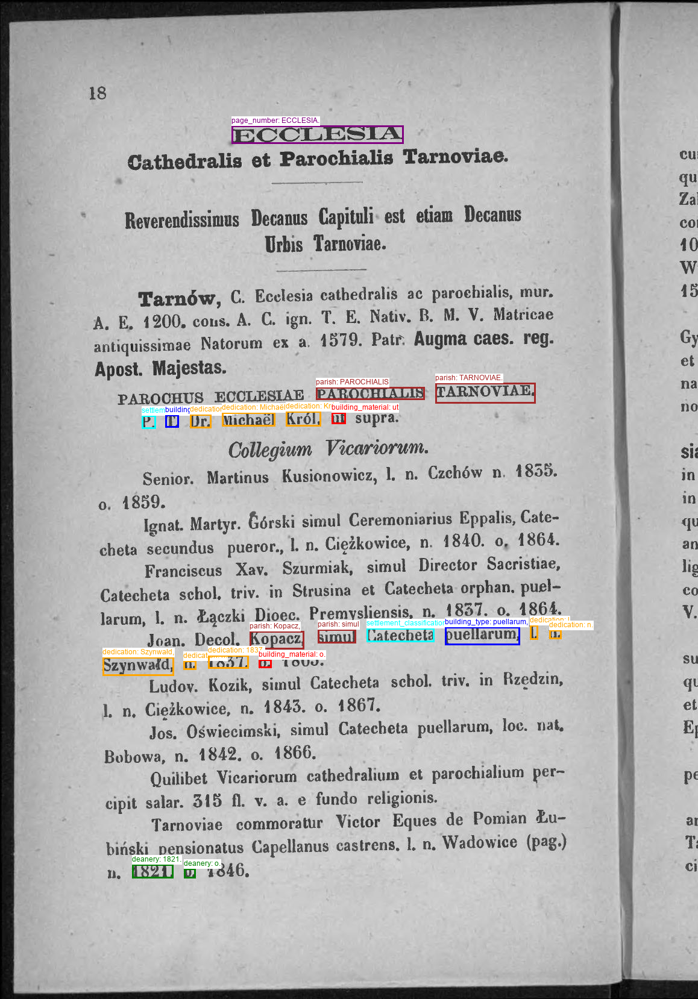

Processing file: 0019.jpg
No ground truth found for 0019.jpg. Skipping.
Processing file: 0020.jpg
No ground truth found for 0020.jpg. Skipping.
Processing file: 0021.jpg
Ground truth:  [{'deanery': 'Dąbrowa', 'parish': 'Bolesław', 'dedication': 'Wojciech Biskup Męczennik', 'material_type': 'mr'}]
Complete text:  J.

In Circulo quondam Tarnoviensi.

1. Decanatus Dabrovaensis.

1. Bolesław, P. E. p. mur. — a. 1632 per Stanisl,
Ligęza e ligno aedif. 22. Oct. 1634 per Thom. Oborski
Ep. Laodicens. cons. dein desolata et combusta, — a. 1731
mur. et per Joann. Skarbek Arcbi-Epp. Leopoliens. cons.
Jam vero a. 1326 in opere per Aug. Theiner edito de hac
ecclesia et curato mentio fit. T. E. S. Adalbertus E. M,
Matr. ex a° 1648. Patr. T. D. Marianus Eques de Sroczyński.

In pago Mẹdrzychów existit sumptibus Adami Com. Po-
tocki Cap. priv. cum privilegio Missae, er. 1841, cons, 1847
per Josepb. Wojtarowicz, Epp. Tarnov. sub T, Immac, Con-
cept. B. M. V.

Par, Joan. Bapt. Eq. de Witski, cum usu R. 

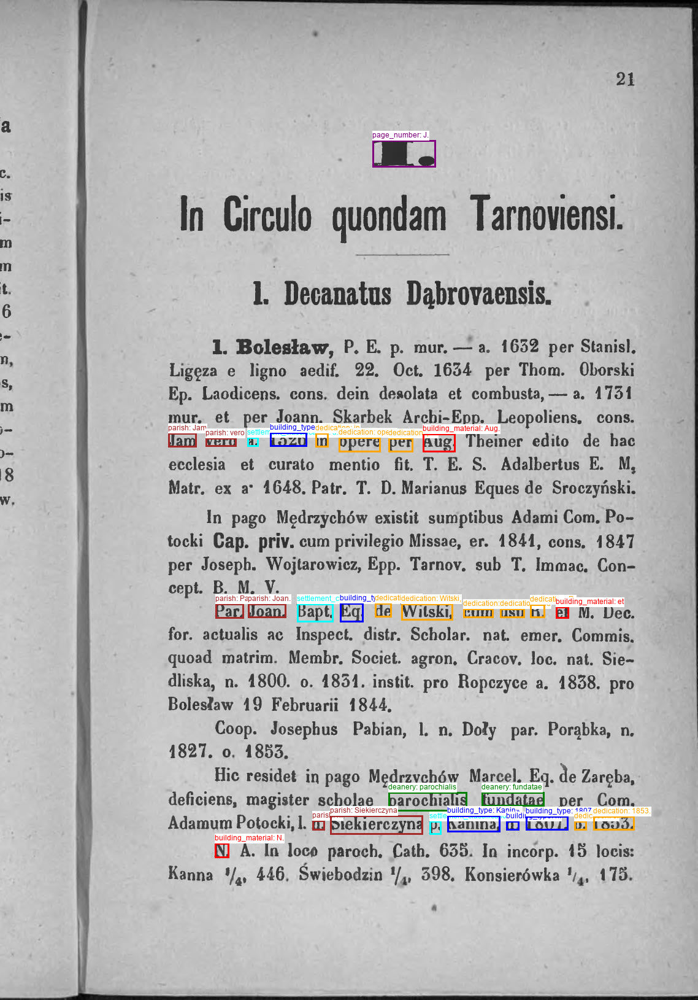

Processing file: 0022.jpg
Ground truth:  [{'deanery': 'Dąbrowa', 'parish': 'Gręboszów', 'dedication': 'Najświętsza Maryja Panna Wniebowzięta', 'material_type': 'mr'}, {'deanery': 'Dąbrowa', 'parish': 'Dąbrowa', 'dedication': 'Wszyscy Święci', 'material_type': 'dr'}]
Complete text:  22

Pawłów 1/,„, 240. Tonia 1,, 334. Grądy Y,,' 320. Wulka
Grądzka 1/,, 340. Bór Grądzki 114, 186. Samocice 1/,, 772.
ẹka 1/,, 172. Podlipie 1/,, 336. Kuzie 1/,, 124. Strójców Y.,
140. Mẹdrzychów Y, 1240. Kupienin ®/, m. 460. — Univ.
Cath. 6206. Jud, 435.

Capitaneatus districtualis et off. postale Dąbrowa.

2. Dabrowa, 0. E. p. lign. A. E. ign. olim praep.
cum proprio Promot. SS. Rosarii. Eccl. antiqua per Nicolaum
Spytek Ligęza Casteļlanum dotata, 1614 per Valerianum
Lubieniecki Epp. Bacoviensem cons. ob vetustatem desolata,
nova amplior 1774. per Cajetanum Potocki Canon. Cracov.
de ligno extructa, per Gregorium Thomam Ziegler Epp. Ty-
niec. 1824. cons. T. E. 00. SS, Matr. ant. ex a. 1611.
Patr. T. D. Euge

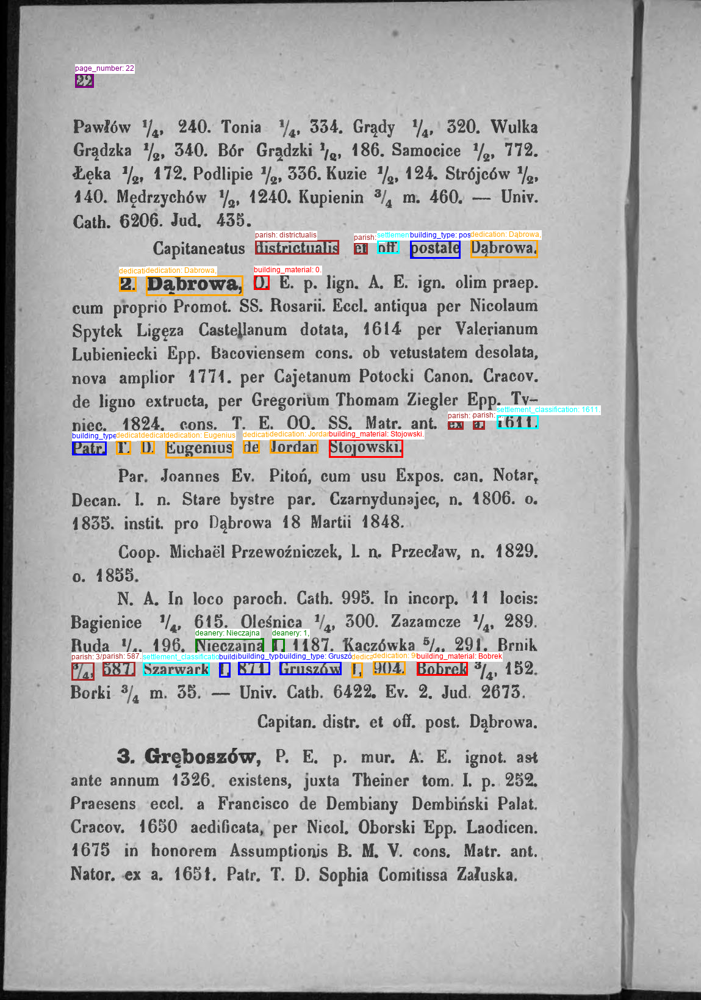

Processing file: 0023.jpg
Ground truth:  [{'deanery': 'Dąbrowa', 'parish': 'Olesno', 'dedication': 'Katarzyna Panna Męczennica', 'material_type': 'mr'}, {'deanery': 'Dąbrowa', 'parish': 'Luszowice', 'dedication': 'Józef Oblubieniec Najświętszej Maryi Panny', 'material_type': 'dr-mr'}]
Complete text:  23

Penes hujatem 'Eccl. existit Confr. S. Annae; in pago
Borusowa adest capella priv. sub T. Maternitatis B. M, V.
Par. Henricus Otowski, Vice-Decanus, 1. n. Krościenko,
n. 1823. o. 1849. instit. pro Greboszów 29. Nov. 1858..
Coop. Mathias Pająk, loc. nat. Borek p. Bzezawa, n.
1818. o. 1843.
N. A. In loco paroch. Cath. 408. In incorp. 14 locis:
Wola - Grẹęboszowska 1/,, 418.. Karsy 1/,, 347. Uście Jezu-
ickie Y,, 380. Bieniszowice. 1/,, 267. Pałuszyce cis et trans
Dunajec 7/4, 320.’ Lubiczko 1, 309. Borusowa 3/,, 455.
Hubenice . 3/,, 324. Kozšów */,, 210. Biskupice 1/,, 190.
Zawierzbie 1,, 152. Zalipie 1, 746. Wola Żelichowska 3dr
540. Zapəasternicze 1, m. 121. — Univ. Cath. 5187. Ev.
8. 

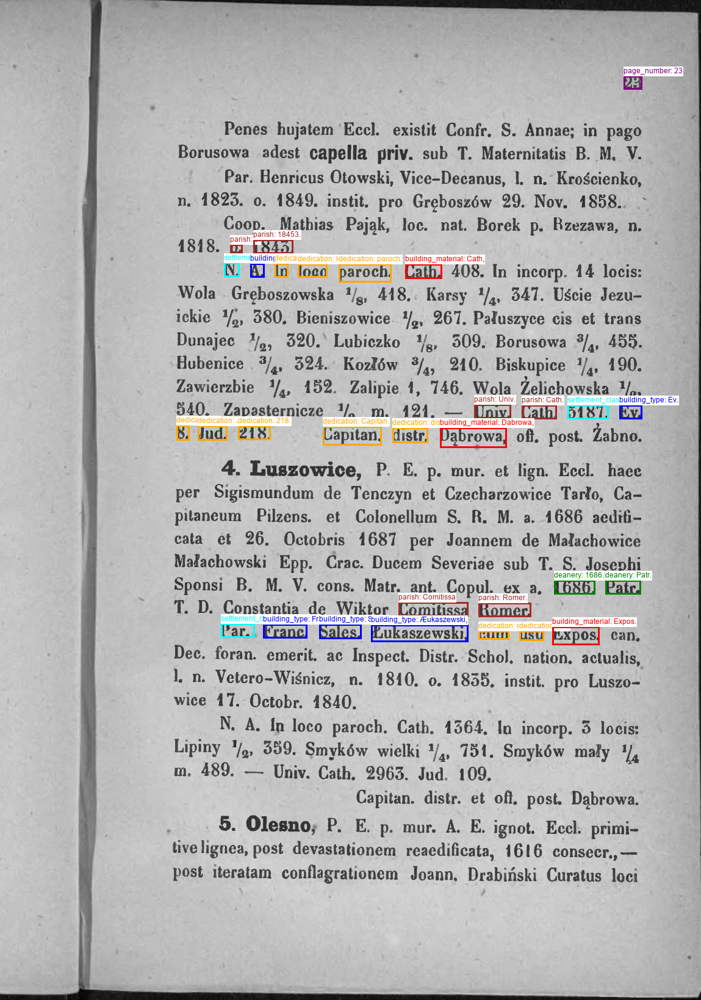

Processing file: 0024.jpg


KeyboardInterrupt: 

In [ ]:
from mistral_common.protocol.instruct.messages import (
    AssistantMessage,
    UserMessage,
    ToolMessage,
    SystemMessage,
)
from mistral_common.protocol.instruct.request import ChatCompletionRequest
from mistral_common.protocol.instruct.response import ChatCompletionResponse

from mistralai.models import Messages

import json
import os
from mistralai import Mistral
from typing import List
from PIL import Image


class LLMInterface:
    def __init__(self,client , model_name: str, system_prompt: str, output_prompt: str):
        self.SYSTEM_PROMPT = system_prompt
        self.client = client
        self.model_name = model_name
        self.output_prompt = output_prompt

        self.clear_messages()

        self.tokenizer = MistralTokenizer.v3()



    def translate_poltish_to_latin(self, text: str) -> str:

        system_prompt = f""" You are given a list of polish parish names, dedications and building materials.
        Your task is to translate them to to their origin latin form. 
        You should not change the order of the tokens and you should not add any other text.
        Format the output nicely for the llm to read.
        Dedications often appear in the short forms so generate couple of examples of the short forms and their long forms.
        Present the original text and translation to latin.
        

        #EXAMPLES
        building material: dr -> lignear, lig., | mr -> murata, mur. | ex muro
        parish: Włocławek -> Wladislavia, | Dobrzyce -> Dobrzicium, | Dmenin -> Dmenin
        dedication: Święta Magda Magdalena -> Sancta Maria Magdalena | Maryja Dziewica -> Sancta Maria Virginis or S.M.V 

        """
        prompt = f"""
        # Translate the following text from Polish to Latin:
        {text}
        /no_think
        """
        messages = [
            SystemMessage(
                role="system",
                content=system_prompt.strip(),
            ),
            UserMessage(
                role="user",
                content=prompt.strip(),
            ),
        ]
        serializable_messages = [
            {"role": msg.role, "content": msg.content}
            for msg in messages
        ]
        print("-"*20, "Streaming translation response", "-"*20)
        print(f"Model: {self.model_name}")
        print(f"Prompt: {prompt}")
        response = self.client.chat.completions.create(
            model=self.model_name,
            messages=serializable_messages,
            stream=True,
        )
        complete_response = ""
        for streamed_response in response:
            if streamed_response.choices[0].delta.content:
                print(streamed_response.choices[0].delta.content, end="", flush=True)
                complete_response += streamed_response.choices[0].delta.content
            else:
                print(" ", end="", flush=True)
        print("\n", "-"*20, "End of streamed translation response", "-"*20)
        return complete_response.strip()            

        
    def get_message_tokens(self) -> List[str]:
        """
        Get the tokens of the messages in the conversation.
        """
        messages = self.messages.copy()
        messages.pop()

        return self.tokenizer.encode_chat_completion(
            ChatCompletionRequest(messages=messages, model=self.model_name)
        ).tokens
        

    def clear_messages(self):
        self.messages: List[Messages] = [
                SystemMessage(
                    role="system",
                    content=self.SYSTEM_PROMPT.strip(),
                )]
        
    def setup_prompt(self, complete_text, ground_truth: str, fewshot_examples: str):

        formated_ground_truth = ""
        for item in ground_truth:
            formated_ground_truth += "Ground truth item:\n"
            for k,v in item.items():
                formated_ground_truth += f"{k}: {v}\n"
                
        prompt = f"""
        # Ground truth for provided tokens translated to Polish, every item corresponds to one parish:
        {self.translate_poltish_to_latin(formated_ground_truth)}
        # Few-shot examples:
        {fewshot_examples}
        # Complete text:
        {complete_text}
        {self.output_prompt}
        """

        self.messages.append(
            UserMessage(
                role="user",
                content=prompt,
            )
        )
        return prompt

    def send_request(self, batch_i, batch_num: int, tokens_batch: str):
        print(f"Sending request for batch {batch_i} out of {batch_num} batches")
        prompt = f"""
        ### input tokens:
        {tokens_batch}
        ### Output tokens:
        """
        
        if len(self.messages) == 2:
            self.messages[-1].content += prompt + "/no_think"  # /no_think is a flag to not think and just return the answer
        else:
            self.messages.append(
                UserMessage(
                    role="user",
                    content=prompt + "/no_think", # /no_think is a flag to not think and just return the answer
                )
            )
            

        serializable_messages = [
            {"role": msg.role, "content": msg.content}
            for msg in self.messages
        ]

        print("-"*20, "Streamed response", "-"*20)
        print(f"Model: {self.model_name}")

        response = self.client.chat.completions.create(
            model=self.model_name,
            messages=serializable_messages,
            stream=True,
        )
        complete_response = ""
        for streamed_response in response:
            if streamed_response.choices[0].delta.content:
                print(streamed_response.choices[0].delta.content, end="", flush=True)
                complete_response += streamed_response.choices[0].delta.content
            else:
                print(" ", end="", flush=True)

        print("\n", "-"*20, "End of streamed response", "-"*20)


        
        self.messages.append(
            AssistantMessage(
                role="assistant",
                content=complete_response,
            )
        )
        return complete_response




    def get_bio_tags(self, tokens_sequence: List[str], complete_text: str, batch_size: int = 50):
        """
        Process tokens in batches and get BIO tags from LLM.
        
        Args:
            tokens_sequence: List of tokens to process
            complete_text: The complete text for context
            batch_size: Number of tokens per batch
        
        Returns:
            tuple: (tokens, tags) - two lists of the same size
        """
        all_tags = []

        num_of_batches = len(tokens_sequence) // batch_size + 1
        print(f"Total number of batches: {num_of_batches}")
        
        for i in range(0, len(tokens_sequence), batch_size):
            print(f"Processing {i//batch_size + 1} batch.")
            
            batch = tokens_sequence[i:i + batch_size]
            print(f"Batch size: {len(batch)}")
            batch_text = "\n".join(batch)


            
            bio_tags_string = self.send_request(batch_i=i, batch_num=num_of_batches, tokens_batch=batch_text)
            
            # Parse response to extract tags
            batch_tags = []

            bio_tags_string = bio_tags_string.replace("<think>", "")
            bio_tags_string = bio_tags_string.replace("</think>", "")
            bio_tags_string = bio_tags_string.strip()

            for line in bio_tags_string.strip().split("\n"):
                if "\t" in line:
                    # Split by tab and get the tag part
                    parts = line.split("\t")
                    if len(parts) >= 2:
                        batch_tags.append(parts[1])
                else:
                    # If format is wrong, use O tag as default
                    print(f"Warning: Unexpected format in line: {line}")
                    batch_tags.append("O")
            
            # Check if the number of tags matches the number of tokens
            if len(batch_tags) != len(batch):
                print(f"Warning: Number of tags ({len(batch_tags)}) doesn't match number of tokens ({len(batch)})")
                # If too few tags, pad with "O"
                while len(batch_tags) < len(batch):
                    batch_tags.append("O")
                # If too many tags, truncate
                batch_tags = batch_tags[:len(batch)]
            
            # Add batch tags to all tags
            all_tags.extend(batch_tags)
        
        # Ensure we have the right number of tags (defensive)
        all_tags = all_tags[:len(tokens_sequence)]
        while len(all_tags) < len(tokens_sequence):
            all_tags.append("O")
        
        return tokens_sequence, all_tags
            

            



s
        

from PIL import Image
import pytesseract
import os
from utils import preprocess_for_ocr, visualize_entity_boxes

SCHEMATISMS_DIR = "/Users/user/Projects/AI_Osrodek/data/schematyzmy"
EVALUATED_SCHEMATISM = "tarnow_1870"

# client = OpenAI(
#     base_url="http://localhost:1234/v1",
#     api_key="lm-studio"       # LM Studio doesn’t enforce a real key
# )
client_mistral = Mistral(api_key="")

llm_interface = LLMInterface(
    client=client_mistral,
    model_name="mistral-medium-latest",
    # model_name="qwen3-30b-a3b-mlx",
    system_prompt=SYSTEM_PROMPT.strip(),
    output_prompt=OUTPUT_FORMAT.strip(),
)
focus_pages = ["0011.jpg"]
    

results = []
def visualize_entity_boxes(image, boxes, preds, words, id2label, output_path=None):
    """
    Visualize detected entities on an image.
    """
    from PIL import Image, ImageDraw, ImageFont
    import os
    image = image.convert("RGB")
    image_draw = image.copy()
    draw = ImageDraw.Draw(image_draw)
    
    try:
        font = ImageFont.truetype("Arial", 12)
    except IOError:
        font = ImageFont.load_default()
    
    label2color = {
        'building_material': 'red',
        'building_type': 'blue',
        'deanery': 'green',
        'dedication': 'orange',
        'page_number': 'purple',
        'parish': 'brown',
        'settlement_classification': 'cyan',
        'O': 'gray'
    }
    
    for i, (box, pred, word) in enumerate(zip(boxes, preds, words)):

        if isinstance(pred, int):
            label = id2label.get(pred, "O")
        else:
            label = pred
            
        if label == "O":
            continue
            
        if label.startswith("B-") or label.startswith("I-"):
            entity_type = label[2:]
        else:
            entity_type = label
            
        
        color = label2color.get(entity_type, 'yellow')
        
        draw.rectangle(box, outline=color, width=3)
        
        label_text = f"{entity_type}: {word}"
        text_y = max(0, box[1] - 15)
        
        text_width = draw.textlength(label_text, font=font)
        draw.rectangle(
            [box[0], text_y, box[0] + text_width, text_y + 15],
            fill=(255, 255, 255, 180)
        )
        
        draw.text(
            (box[0], text_y),
            label_text,
            fill=color,
            font=font
        )

    if output_path:
        image_draw.save(output_path)
        
    display(image_draw)
    return image_draw




for file_name in sorted(os.listdir(os.path.join(SCHEMATISMS_DIR, EVALUATED_SCHEMATISM))):
    if not file_name.endswith(".jpg"):
        continue

    print(f"Processing file: {file_name}")
    image_path = os.path.join(SCHEMATISMS_DIR, EVALUATED_SCHEMATISM, file_name)


    ground_truth = joined_gdf[joined_gdf["location"] == file_name].drop(columns=["location", "geometry", "index_right", "schematism"]).to_dict(orient="records")
    
    if len(ground_truth) == 0:
        print(f"No ground truth found for {file_name}. Skipping.")
        results.append({
            "file_name": file_name,
            "words": words,
            "bboxes": bboxes,
            "predictions": "O" * len(words)
            })
        continue
    
    words, bboxes = get_ocr_data(image_path)
    complete_text = pytesseract.image_to_string(image_path, lang="lat")
    print("Ground truth: ", ground_truth)
    print("Complete text: ", complete_text)
    # llm_interface.clear_messages()
    # llm_interface.setup_prompt(
    #     complete_text=complete_text,
    #     ground_truth=ground_truth,
    #     fewshot_examples=fewshot_string
    # )
    
    # token_sequence, predictions = llm_interface.get_bio_tags(words, complete_text)
    # print("Chat completion consumed: ", len(llm_interface.get_message_tokens()))

    results.append({
        "file_name": file_name,
        "words": words,
        "bboxes": bboxes,
        "predictions": predictions
    })

    with Image.open(image_path) as image:
        visualize_entity_boxes(
        image=image,
        boxes=bboxes,
        preds=predictions,
        words=words,
        id2label=layoutlmv3_interface.id2label,
        )


In [ ]:
ground_truth

[{'deanery': '[brak informacji]',
  'parish': 'Tarnów',
  'dedication': 'Narodzenie Najświętszej Maryi Panny',
  'material_type': 'mr'}]

In [ ]:
for message in llm_interface.messages:
    print(f"{message.role}: {message.content}")

In [ ]:
# After you get the response from the model

tokenizer = MistralTokenizer.v3(is_tekken=True)
messages = llm_interface.messages.copy()
messages.pop()



print("Token count in response:", len(tokens))

In [ ]:
for message in messages:
    print(f"{message.role}: {message.content}")

In [ ]:
with open(os.path.join(SCHEMATISMS_DIR, EVALUATED_SCHEMATISM, "results.json"), "w") as f:
    f.write(json.dumps(results, indent=4))

In [ ]:
from openai import OpenAI

client = OpenAI(
    base_url="http://localhost:1234/v1",
    api_key="lm-studio"       # LM Studio doesn’t enforce a real key
)

client.chat.completions.create(
    model="meta-llama-3.1-8b-instruct",
    messages=[{"role":"user","content":"Hi there!/no_think"}],
    temperature=0.0,
)

In [ ]:
system_prompt = """You are a specialized extraction assistant that identifies and labels specific information from 19th‑century Latin ecclesiastical schematisms (diocesan notices).

Your task is to extract labeled text spans from Latin‑Polish diocesan notices and return them as a JSON list with positional information. You must align Latin terms in the source text with their Polish equivalents in the ground‑truth table.

---

## Labels and Their Meanings

| Label                  | What to Extract                    | Latin Format Examples                                                                               | Polish Translation              |
| ---------------------- | ---------------------------------- | --------------------------------------------------------------------------------------------------- | ------------------------------- |
| **parish**             | Parish name                        | Usually capitalized; follows the ordinal number **or** appears as the first word in the notice line | Direct name (may vary slightly) |
| **page\_number**       | Page number in the schematism      | Usually numeric, often first in notice                                                              | Same number                     |
| **dedication**         | Church's dedication / patron saint | `S.`, `SS.`, `B.M.V.`, `Nativ.` etc.                                                                | Full saint name in Polish       |
| **building\_material** | Church construction material       | `mur.`, `mr`, `murata`, `ex muro` (masonry) — `lig.`, `l.`, `dr`, `lignea` (wood)                   | `murowany` / `drewniany`        |
| **deanery**            | Deanery name                       | Appears after `dekanat` or `decanatus`                                                              | Name in Polish                  |

---

## **Parsing Rules** (supersede earlier versions)

1. **Notice boundaries**
   *Ignore headings.* Textual headers such as `ECCLESIA Cathedr. …`, `PAROCHUS …`, etc. belong to the preceding context and **must be ignored** for extraction purposes. The *notice proper* begins at the first line that either:

   * starts with an ordinal number (`"1.", "2.", "—"`, etc.), **or**
   * starts with the parish name in its Polish nominative form followed by a comma.

2. **Parish name (form preference)**

   * Extract the **nominative form that appears verbatim** in the tokens, favouring the Polish spelling with diacritics (e.g., `Tarnów`).
   * Disregard Latinised genitive/locative endings such as `-ae`, `-i`, `-ensis`, etc. (`Tarnoviae`, `Cracoviae`) **unless** no Polish nominative form occurs anywhere in the notice.

3. **Ground‑truth alignment**

   * If the Polish nominative form is present, extract that form so that it matches the Polish ground‑truth table.
   * If only a Latin form is available, extract that Latin form **and** update the ground‑truth table accordingly (outside this assistant).

4. **Other extraction constraints** (unchanged)

   1. Extract **only** within the boundaries of a single notice.
   2. Never split or merge tokens that are pre‑segmented in the input.
   3. Match Latin terminology with corresponding Polish concepts in the ground truth.
   4. Include positional information (word indices) for each extraction.
   5. Omit any text that doesn't match the specific labels.

---

## Response Format

Return **only** a JSON array where each element is an object with:

* `label`: one of the defined labels
* `text`: the exact span as it appears in the input tokens (subject to Rule 2)
* `text_match_patch`: a very short snippet of the input text with the extracted text span surrounded by `<LABEL>`…`</LABEL>` tags, sufficient to locate it in context, be sure to include the text before and after the match

---

## Few‑shot Examples
# EXAMPLE 1
### Ground Truth (Polish)
[{'deanery': 'Dąbrowa', 'parish': 'Bolesław', 'dedication': 'Wojciech Biskup Męczennik', 'material_type': 'mr'}]
### Input text
[TEXT_START]
In Circulo quondam Tarnoviensi.

1. Decanatus Dabrovaensis.

1. Bolesław, P. E. p. mur. — a. 1632 per Stanisl,
Ligęza e ligno aedif. 22. Oct. 1634 per Thom. Oborski
Ep. Laodicens. cons. dein desolata et combusta, — a. 1731
mur. et per Joann. Skarbek Arcbi-Epp. Leopoliens. cons.
Jam vero a. 1326 in opere per Aug. Theiner edito de hac
ecclesia et curato mentio fit. T. E. S. Adalbertus E. M,
Matr. ex a° 1648. Patr. T. D. Marianus Eques de Sroczyński.
[TEXT_END]
### OUTPUT
[
  {"label":"deanery", "text":"Decanatus Dabrovaensis.",  "text_match_patch: "In Circulo quondam Tarnoviensi.\n1. <DEANERY>Decanatus Dabrovaensis.</DEANERY>\n1. Bolesław" ,
  {"label":"building_material", "text":"mur.",  "text_match_patch: "combusta, — a. 1731\n<BUILDING_MATERIAL>mur.</BUILDING_MATERIAL> et per" ,
  {"label":"parish", "text":"Bolesław", "text_match_patch: "Decanatus Dabrovaensis.\n1. <PARISH>Bolesław</PARISH>, P. E." ,
  {"label":"dedication", "text":"T. E. S. Adalbertus E. M,",  "text_match_patch: "mentio fit. <DEDICATION>T. E. S. Adalbertus E. M,</DEDICATION>\nMatr." ,
]

# EXAMPLE 2
### Ground Truth (Polish)

Ground truth:  
{'deanery': 'Dąbrowa', 'parish': 'Gręboszów', 'dedication': 'Najświętsza Maryja Panna Wniebowzięta', 'material_type': 'mr'}, 
{'deanery': 'Dąbrowa', 'parish': 'Dąbrowa', 'dedication': 'Wszyscy Święci', 'material_type': 'dr'}]
### Input text
[TEXT_START]
140. Mẹdrzychów Y, 1240. Kupienin ®/, m. 460. — Univ.
Cath. 6206. Jud, 435.

Capitaneatus districtualis et off. postale Dąbrowa.

2. Dabrowa, 0. E. p. lign. A. E. ign. olim praep.
cum proprio Promot. SS. Rosarii. Eccl. antiqua per Nicolaum
Spytek Ligęza Casteļlanum dotata, 1614 per Valerianum
Lubieniecki Epp. Bacoviensem cons. ob vetustatem desolata,
nova amplior 1774. per Cajetanum Potocki Canon. Cracov.
de ligno extructa, per Gregorium Thomam Ziegler Epp. Ty-
niec. 1824. cons. T. E. 00. SS, Matr. ant. ex a. 1611.
Patr. T. D. Eugenius de Jordan Stojowski.
Capitan. distr. et off. post. Dabrowa.

3. Greboszów, P. E. p. mur. A. E. ignot. ast
ante annum 1326, existens, juxta Theiner tom. I. p. 252.
Praesens eccl. a Francisco de Dembiany Dembiński Palat,
Cracov. 1650 aedificata, per Nicol. Oborski Epp. Laodicen.
1675 in honorem Assumptionis B. M. V. cons. Matr. ant.
Nator. -ex a. 165t. Patr. T. D. Sophia Comitissa Załuska,
[TEXT_END]
### OUTPUT
[
   {"label":"parish", "text":"Dąbrowa", "text_match_patch: "postale Dąbrowa. 2. <PARISH>Dabrowa</PARISH>, 0. E." ,
   {"label":"building_material", "text":"lign.",  "text_match_patch: "E. p. <BUILDING_MATERIAL>lign.<BUILDING_MATERIAL> A. E. ign." ,
   {"label":"dedication", "text":"T. E. 00. SS.",  "text_match_patch: "1824. cons. <DEDICATION>T. E. 00. SS.</DEDICATION> Matr. ant." ,
   {"label":"parish", "text":"Greboszów", "text_match_patch: "post. Dabrowa. 3.<PARISH>Greboszów</PARISH>, P. E." ,
   {"label":"building_material", "text":"mur.",  "text_match_patch: "E. p. <BUILDING_MATERIAL>mur.</BUILDING_MATERIAL> A. E. ignot." ,
   {"label": "dedication", "text":"Assumptionis B. M. V.",  "text_match_patch: "in honorem <DEDICATION>Assumptionis B. M. V.</DEDICATION> cons." ,}
]

## END OF EXAMPLES
"""

sample_input_text = """
ECCLESIA
Catheđralis et Parochialis Tarnoviae.

Reverendissimus Decanus Capituli: est etiam Decanus
Urbis Tarnoviae.

Tarnów, C. Ecclesia cathedralis ac paroebialis, mur.
A. E. 1200. cous. A. C. ign. T. E. Nativ. B. M. V. Matricae
antiquissimae Natorum ex a. 14579. Patr: Augma caes. reg.
Apost. Majestas.

PAROCHUS ECCLESIAE PAROCHIALIS TARNOVIAE.
P. T. Dr. Michaël Król, ut supra.

Collegium Vicariorum.

Senior. Martinus Kusionowicz, 1. n. Czchów n. 1853.
o. 1859.

Ignat. Martyr. Ēórski simul Ceremoniarius Eppalis, Cate-
cheta secundus pueror., l. n. Ciężkowice, n. 1840. o, 1864.

Franciscus Xav. Szurmiak, simul Director Sacristiae,
Catecheta schol, triv. in Strusina et Catecheta orphan, puel-
larum, 1. n. Æączki Dioec. Premysliensis, n. 1837. o. 1864.

Joan. Decol. Kopacz, simul Catecheta puellarum, 1. n.
Szynwałd, n. 1837. o. 1863.

Ludov. Kozik, simul Catecheta schol. triv. in Rzędzin,
]. n, Cieżkowice, n. 1843. o. 1867.

Jos. Oświecimski, simul Catecheta puellarum, loc. nat.
Bobowa, n. 1842. o. 1866.

Quilibet Vicariorum cathedralium et parochialium per-
cipit salar. 315 fl. v. a. e fundo religionis.

Tarnoviae commoratur Victor Eques de Pomian Žu-

biński pensionatus Capellanus castrens. |. n. Wadowice (pag.)
n. 1821. o. 1846."""


user_prompt = f"""
## User Prompt

Extract and label information from this Latin ecclesiastical schematism that corresponds to the provided ground truth table in Polish.

### Ground Truth (Polish)

json beggin
  "deanery": "[brak informacji]",
  "parish": "Tarnów",
  "dedication": "Narodzenie Najświętszej Maryi Panny",
  "material_type": "mr"
json end


### Instructions
1. Identify Latin terms in the tokens that correspond to the Polish ground truth information.
2. For "material_type", look for terms like "mur.", "mr", "murata" (for masonry) or "lig.", "dr", "lignea" (for wood).
3. For "dedication", find Latin abbreviations like "S.", "SS.", "B.M.V.", "Nativ." that represent the Polish saint/dedication.
4. The "parish" name ussually is the same as the one in the ground truth table. It is very important to match the name with the token sequence.
5. Include the position (index) of each token in your output.
6. Return only a JSON array with labeled items - exclude anything that doesn't match the required labels.
7. Dont output the ''' json beggin''' and '''json end''' tags.

"""

<>:1: SyntaxWarning: invalid escape sequence '\_'
<>:1: SyntaxWarning: invalid escape sequence '\_'
/var/folders/lw/767gd31d7d3ctzj1jms858l80000gn/T/ipykernel_49127/975568117.py:1: SyntaxWarning: invalid escape sequence '\_'
  system_prompt = """You are a specialized extraction assistant that identifies and labels specific information from 19th‑century Latin ecclesiastical schematisms (diocesan notices).


In [ ]:
from mistralai import Mistral
messages = [{"role":"system","content":system_prompt},
              {"role":"user","content":user_prompt}]

client = Mistral(api_key="")
response = client.chat.complete(
    model="mistral-medium-latest",
    messages=messages,
    temperature=0.0,
)
print(response.choices[0].message.content)  
import json
import os

[
  {
    "label": "parish",
    "text": "Tarnów",
    "text_match_patch": "Catheđralis et Parochialis Tarnoviae. Reverendissimus Decanus Capituli: est etiam Decanus Urbis Tarnoviae. <PARISH>Tarnów</PARISH>, C. Ecclesia cathedralis ac paroebialis, mur."
  },
  {
    "label": "building_material",
    "text": "mur.",
    "text_match_patch": "Tarnoviae. <PARISH>Tarnów</PARISH>, C. Ecclesia cathedralis ac paroebialis, <BUILDING_MATERIAL>mur.</BUILDING_MATERIAL> A. E. 1200. cous."
  },
  {
    "label": "dedication",
    "text": "Nativ. B. M. V.",
    "text_match_patch": "1200. cous. A. C. ign. T. E. <DEDICATION>Nativ. B. M. V.</DEDICATION> Matricae antiquissimae Natorum ex a. 14579."
  }
]


In [ ]:
from openai import OpenAI

client = OpenAI(
    base_url="http://localhost:1234/v1",
    api_key="lm-studio"       # LM Studio doesn’t enforce a real key
)

messages_no_think = messages.copy()
messages_no_think[-1]["content"] += "/no_think"
response = client.chat.completions.create(
    model="qwen3-30b-a3b-mlx",
    messages=messages_no_think,
    temperature=1,
)


In [ ]:
response_content = response.choices[0].message.content.replace("<think>", "").replace("</think>", "").strip()
response_list = json.loads(response_content)
response_list[1]

{'label': 'dedication',
 'text': 'Nativ. B. M. V.',
 'position': 12,
 'text_match_patch': 'A. E. 1200. cous. A. C. ign. T. E. <DEDICATION>Nativ. B. M. V.</DEDICATION> Matricae'}

In [ ]:
image_path = "/Users/user/Projects/AI_Osrodek/data/schematyzmy/tarnow_1870/0018.jpg"
text, boxes = pytesseract.run_and_get_multiple_output(image_path, extensions=["txt", "box"], lang="lat")
# words, bboxes = get_ocr_data(image_path)



In [ ]:
len(boxes)

21659

In [ ]:
labels = ["O"] * len(words)
labels

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O'

In [ ]:
for word, bbox in zip(words, bboxes):
    print(word)

ECCLESIA.
Cathedralis
et
Parochialis
Tarnoviae.
Reverendissimus
Decanus
Capituli
est
etiam
Decanus
Urbis
Tarnoviae.
Tarnów,
C.
Ecclesia
cathedralis
ac
paroehialis,
mur.
A.
E.
1200.
cous.
A.
€.
ign.
T.
E.
Nativ.
B.
M.
V,
Matricae
antiquissimae
Natorum
ex
a.
4579.
Patr:
Augma
caes.
reg.
Apost.
Majestas.
PAROCHUS
ECCLESIAE
PAROCHIALIS
TARNOVIAE.
P.
T.
Dr.
Michaël
Król,
ut
supra.
Collegium
Vicariorum.
Senior.
Martinus
Kusionowicz,
1.
n.
Czchów
n.
18533.
o.
1839.
Ignat.
Martyr.
lórski
simul
Ceremoniarius
Eppalis,
Cate-
cheta
secundus
pueror.,
Í.
n.
Ciężkowice,
n.
1840.
o.
1864.
Franciscus
Xav.
Szurmiak,
simul
Director
Sacristiae,
Catecheta
schol,
triv.
in
Strusina
et
Catecheta
orphan.
puel-
larum,
1.
n.
Æączki
Dioec.
Premysliensis,
n.
1837.
o.
1864.
Jaan.
Decol,
Kopacz,
simul
Catecheta
puellarum,
l
n.
Szynwałd,
n.
1837.
o.
1863.
Ludov.
Kozik,
simul
Catecheta
schol.
triv.
in
Rzędzin,
1.
n.
Ciẹżkowice,
n.
1845.
o.
1867,
Jos.
Oswiecimski,
simul
Catecheta
puellarum,
loe.
nat,
Bobowa,
n.
1842.
o

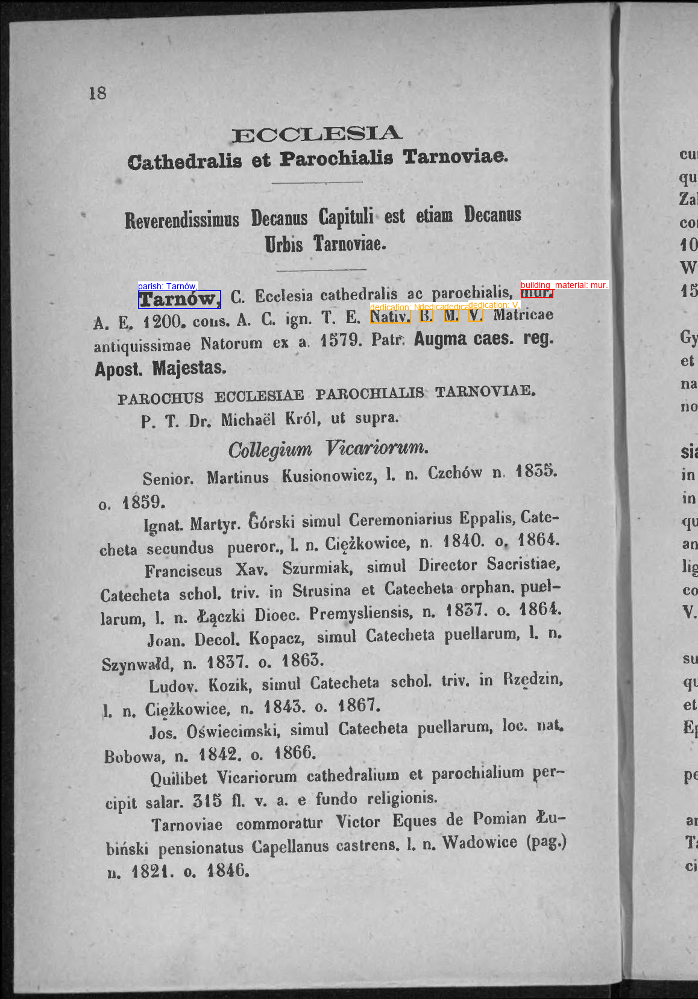

In [ ]:
def visualize_tokens_with_labels(image_path, words, bboxes, labels, output_path=None):
    """
    Visualize tokens with bounding boxes and colored labels on the image.
    Ignores tokens with label "O".
    Available labels: {'O', 'building_material', 'dedication', 'parish'}
    """
    from PIL import Image, ImageDraw, ImageFont

    # Define colors for each label
    label2color = {
        'building_material': 'red',
        'dedication': 'orange',
        'parish': 'blue',
        'deanery': 'green',
    }

    # Open image
    with Image.open(image_path) as img:
        img = img.convert("RGB")
        draw = ImageDraw.Draw(img)
        try:
            font = ImageFont.truetype("Arial", 14)
        except IOError:
            font = ImageFont.load_default()

        for word, bbox, label in zip(words, bboxes, labels):
            if label == "O":
                continue
            color = label2color.get(label, "black")
            draw.rectangle(bbox, outline=color, width=2)
            # Draw label and word above the box
            label_text = f"{label}: {word}"
            # Use textbbox instead of textsize
            left, top, right, bottom = draw.textbbox((0, 0), label_text, font=font)
            text_width = right - left
            text_height = bottom - top
            text_x, text_y = bbox[0], max(0, bbox[1] - text_height)
            draw.rectangle([text_x, text_y, text_x + text_width, text_y + text_height], fill=(255,255,255,180))
            draw.text((text_x, text_y), label_text, fill=color, font=font)

        if output_path:
            img.save(output_path)
        return img

annotated_image = visualize_tokens_with_labels(
    image_path=image_path,
    words=words,
    bboxes=bboxes,
    labels=labels,
    # output_path=os.path.join(SCHEMATISMS_DIR, EVALUATED_SCHEMATISM, "0018_labels.jpg")
)
display(annotated_image)